# Description
Title: Charting the Heterogeneity of Colorectal Cancer Consensus Molecular Subtypes using Spatial Transcriptomics

Sample info:
- Disease: Colorectal Cancer
- Model: Human CRC tissues
- Sample size: 7 patient
- Replicate: 2 per patient
- Localization: Cecum, Colon, Rectum, Sigma
- Diagnosis: Adenocarcinoma
- Metastasis: Yes
- Storage: fresh-frozen (FF)
- QC: 1233 to 5457 per spot

Tech info:
- Library: Spatial Transcriptomics (ST)
- Company: 10x Genomics VISIUM

Main analyses:
- Cell2Location deconvolution
- CMS signatures and TME
- cell communication events

# download data
- `pip install zenodo-get`
- `zenodo_get https://doi.org/10.5281/zenodo.7553463`
- https://github.com/alberto-valdeolivas/ST_CRC_CMS

# additional datasets
- scRNA-seq reference for Cell2Location deconvolution
- CRC - CMS (The Consensus Molecular Subtypes of Colorectal Cancer)
- scRNA-seq (CRC tumors and their TME7,9,12–14)
- ST CRC, Wu et al.19
- bulk transcriptomics of CRC patients by Peng et al.20

# example of usage

In [4]:
library(Seurat)
# library(SeuratData)
library(ggplot2)
library(patchwork)
library(dplyr)

## Sox9 paper

In [33]:
seuset <- readRDS("Intermediary_FileObjects/SeuratList_Clusters_Res05.rds")

Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


In [43]:
seuset.merge <- seuset[["SN048_A121573_Rep1"]]

In [44]:
for (i in names(seuset)) {
    print(i)
    if (i == "SN048_A121573_Rep1") next
    seuset.merge <- merge(seuset.merge, seuset[[i]])
}

[1] "SN048_A121573_Rep1"
[1] "SN048_A121573_Rep2"


Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


[1] "SN048_A416371_Rep1"
[1] "SN048_A416371_Rep2"


Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


[1] "SN123_A551763_Rep1"
[1] "SN123_A595688_Rep1"


Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


[1] "SN123_A798015_Rep1"
[1] "SN123_A938797_Rep1_X"


Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


[1] "SN124_A551763_Rep2"
[1] "SN124_A595688_Rep2"


Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


[1] "SN124_A798015_Rep2"
[1] "SN124_A938797_Rep2"


Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


[1] "SN84_A120838_Rep1"
[1] "SN84_A120838_Rep2"


Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


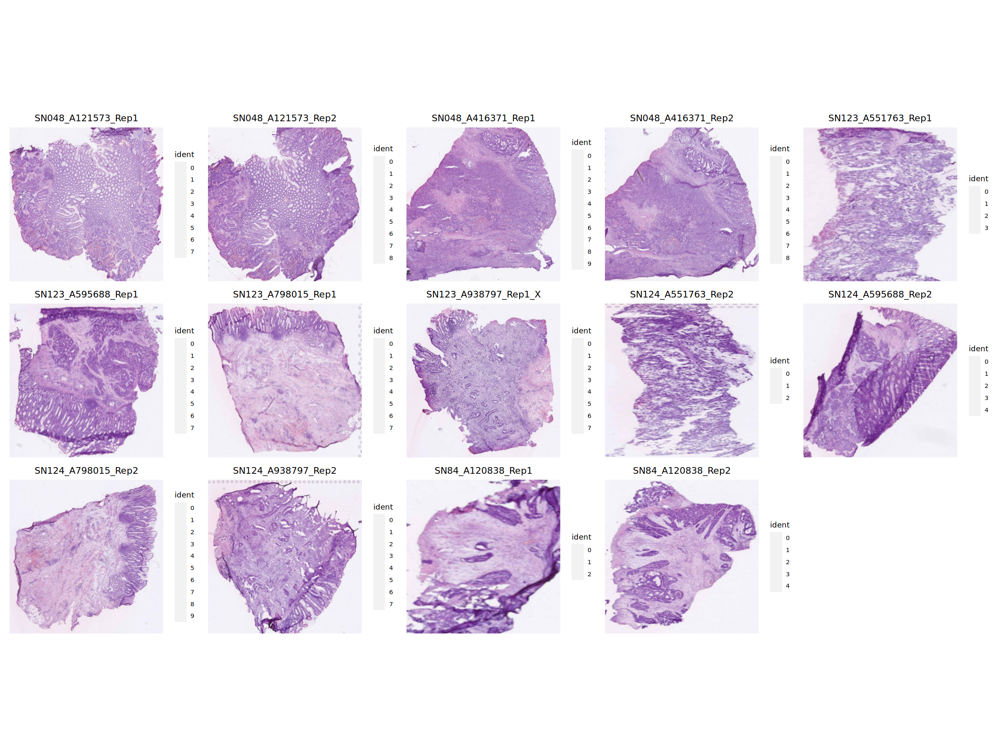

In [64]:
options(repr.plot.width=20, repr.plot.height=15)
SpatialDimPlot(seuset.merge, ncol = 5, alpha = 0)

## subset

In [6]:
s1r1 <- seuset$SN048_A121573_Rep1

In [7]:
s1r1

An object of class Seurat 
55475 features across 2200 samples within 2 assays 
Active assay: SCT (18874 features, 3000 variable features)
 1 other assay present: Spatial
 2 dimensional reductions calculated: pca, umap
 1 image present: SN048_A121573_Rep1

In [12]:
head(s1r1@meta.data)

,orig.ident,nCount_Spatial,nFeature_Spatial,percent.mt,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<fct>,<fct>
AAACAAGTATCTCCCA-1,SN048_A121573_Rep1,17364,5341,2.868003,13072,5258,7,7
AAACACCAATAACTGC-1,SN048_A121573_Rep1,22320,5674,8.337814,12828,4970,0,0
AAACATTTCCCGGATT-1,SN048_A121573_Rep1,7669,3170,6.011214,10934,3188,1,1
AAACCCGAACGAAATC-1,SN048_A121573_Rep1,27100,6756,3.372694,12934,5311,3,3
AAACCGGGTAGGTACC-1,SN048_A121573_Rep1,12265,4295,7.778231,12135,4291,0,0
AAACCGTTCGTCCAGG-1,SN048_A121573_Rep1,8729,3453,4.994845,10946,3449,2,2


In [11]:
s1r1.anno <- readRDS("Pathology_SpotAnnotations/Pathologist_Annotations_SN048_A121573_Rep1.rds")

In [14]:
rownames(s1r1.anno) <- s1r1.anno$spot_id

In [15]:
head(s1r1.anno)

,spot_id,orig.ident,nCount_Spatial,nFeature_Spatial,percent.mt,nCount_SCT,nFeature_SCT,SCT_snn_res.0.5,seurat_clusters,Pathologist_Annotations
,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<int>,<fct>,<fct>,<chr>
AAACAAGTATCTCCCA-1,AAACAAGTATCTCCCA-1,SN048_A121573_Rep1,17364,5341,2.868003,13072,5258,7,7,epithelium&lamina propria
AAACACCAATAACTGC-1,AAACACCAATAACTGC-1,SN048_A121573_Rep1,22320,5674,8.337814,12828,4970,0,0,exclude
AAACATTTCCCGGATT-1,AAACATTTCCCGGATT-1,SN048_A121573_Rep1,7669,3170,6.011214,10934,3188,1,1,lamina propria
AAACCCGAACGAAATC-1,AAACCCGAACGAAATC-1,SN048_A121573_Rep1,27100,6756,3.372694,12934,5311,3,3,tumor
AAACCGGGTAGGTACC-1,AAACCGGGTAGGTACC-1,SN048_A121573_Rep1,12265,4295,7.778231,12135,4291,0,0,tumor
AAACCGTTCGTCCAGG-1,AAACCGTTCGTCCAGG-1,SN048_A121573_Rep1,8729,3453,4.994845,10946,3449,2,2,epithelium&lamina propria


In [16]:
s1r1$Pathologist_Annotations <- s1r1.anno[colnames(s1r1),]$Pathologist_Annotations

In [17]:
table(s1r1$Pathologist_Annotations)


         epithelium&lamina propria                            exclude 
                               692                                151 
       IC aggregate_lamina propria                     lamina propria 
                                32                                188 
                non neo epithelium stroma_fibroblastic_IC med to high 
                               293                                249 
                             tumor        tumor&stroma_IC med to high 
                               337                                258 

In [18]:
# plot1 <- VlnPlot(s1r1, features = "nCount_Spatial", pt.size = 0.1) + NoLegend()
# plot2 <- SpatialFeaturePlot(s1r1, features = "nCount_Spatial") + theme(legend.position = "right")
# wrap_plots(plot1, plot2)

In [22]:
# p <- SpatialFeaturePlot(s1r1, features = "Pathologist_Annotations") + theme(legend.position = "right")
# p

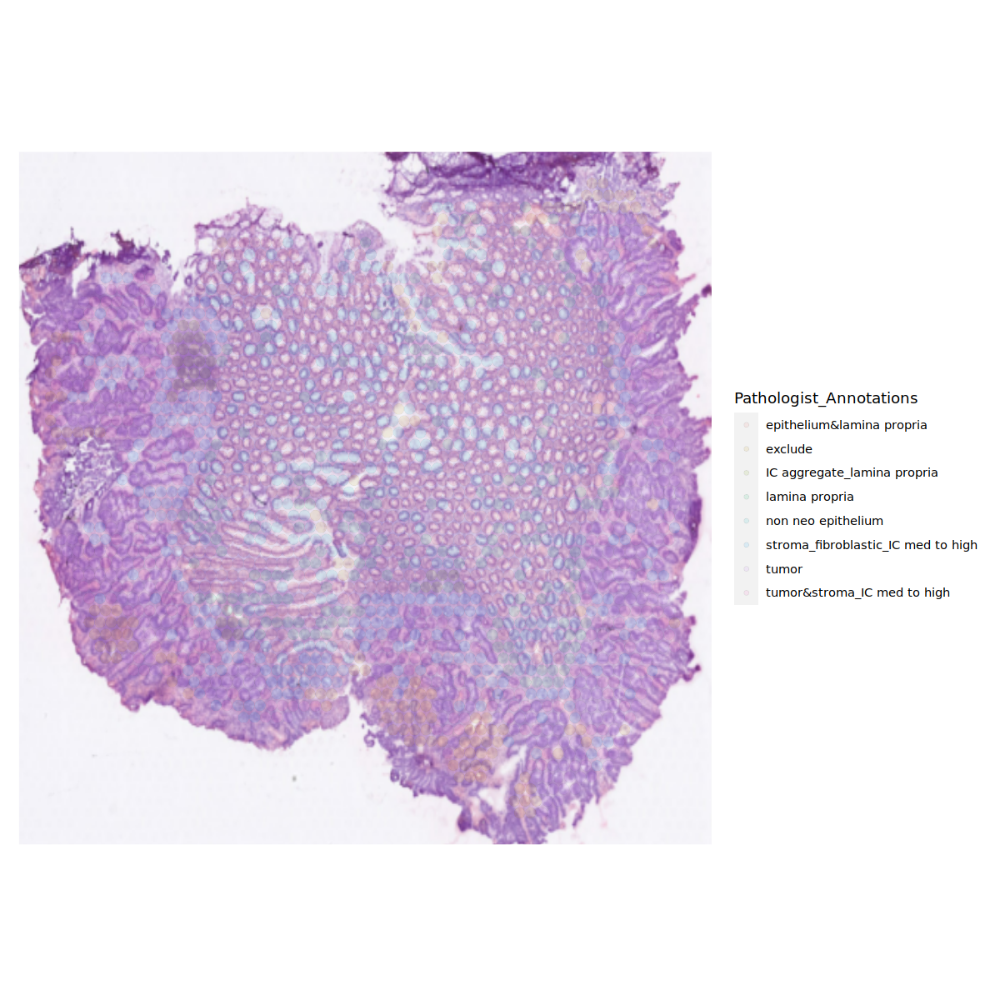

In [30]:
options(repr.plot.width=10, repr.plot.height=10)
SpatialDimPlot(s1r1, label = F, group.by = "Pathologist_Annotations", alpha = 0.1)

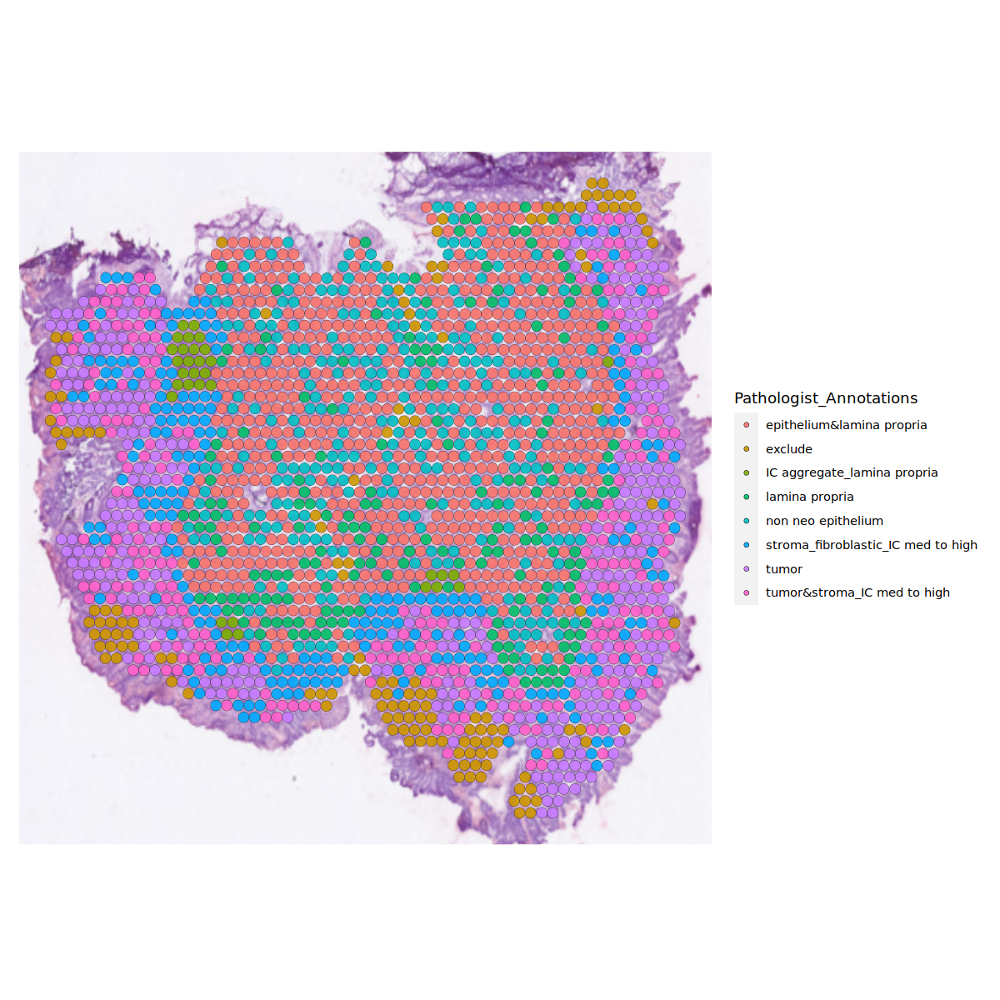

In [31]:
options(repr.plot.width=10, repr.plot.height=10)
SpatialDimPlot(s1r1, label = F, group.by = "Pathologist_Annotations", alpha = 0.9)

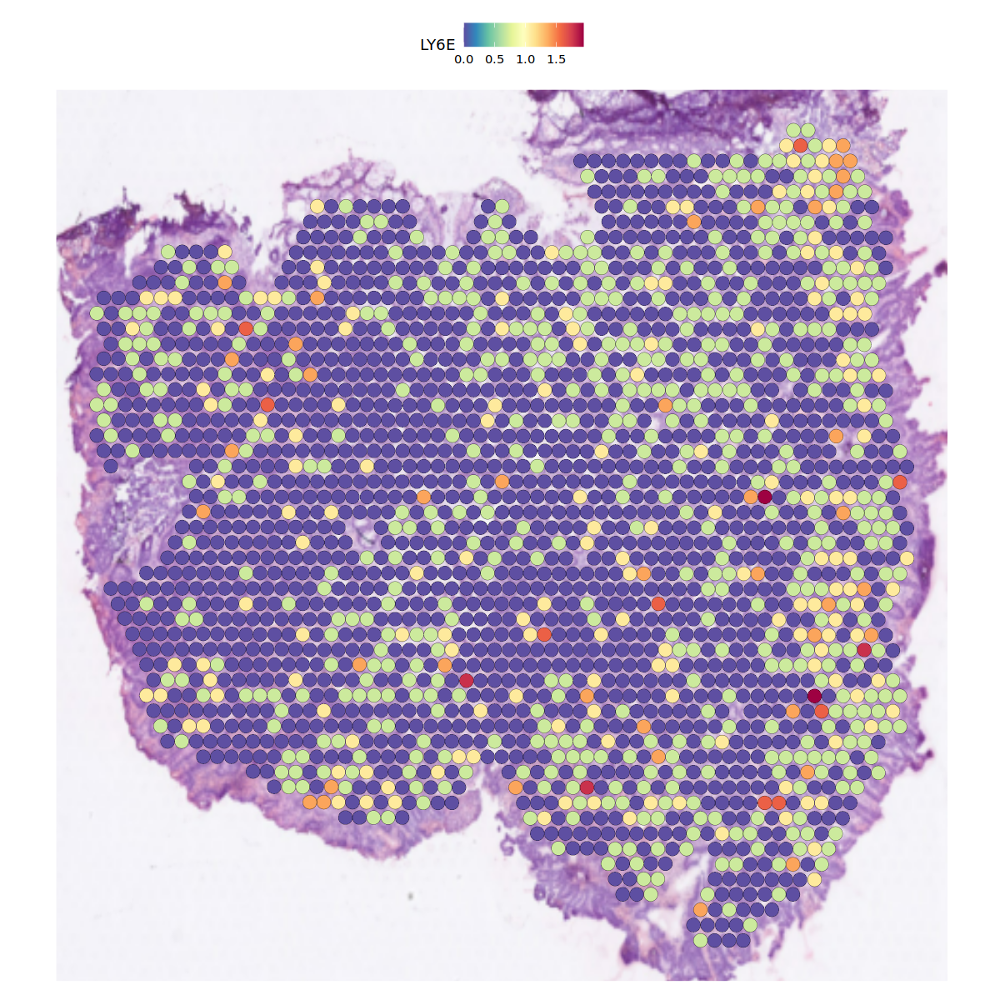

In [49]:
# rege
options(repr.plot.width=10, repr.plot.height=10)
SpatialFeaturePlot(s1r1, features = c("LY6E"))

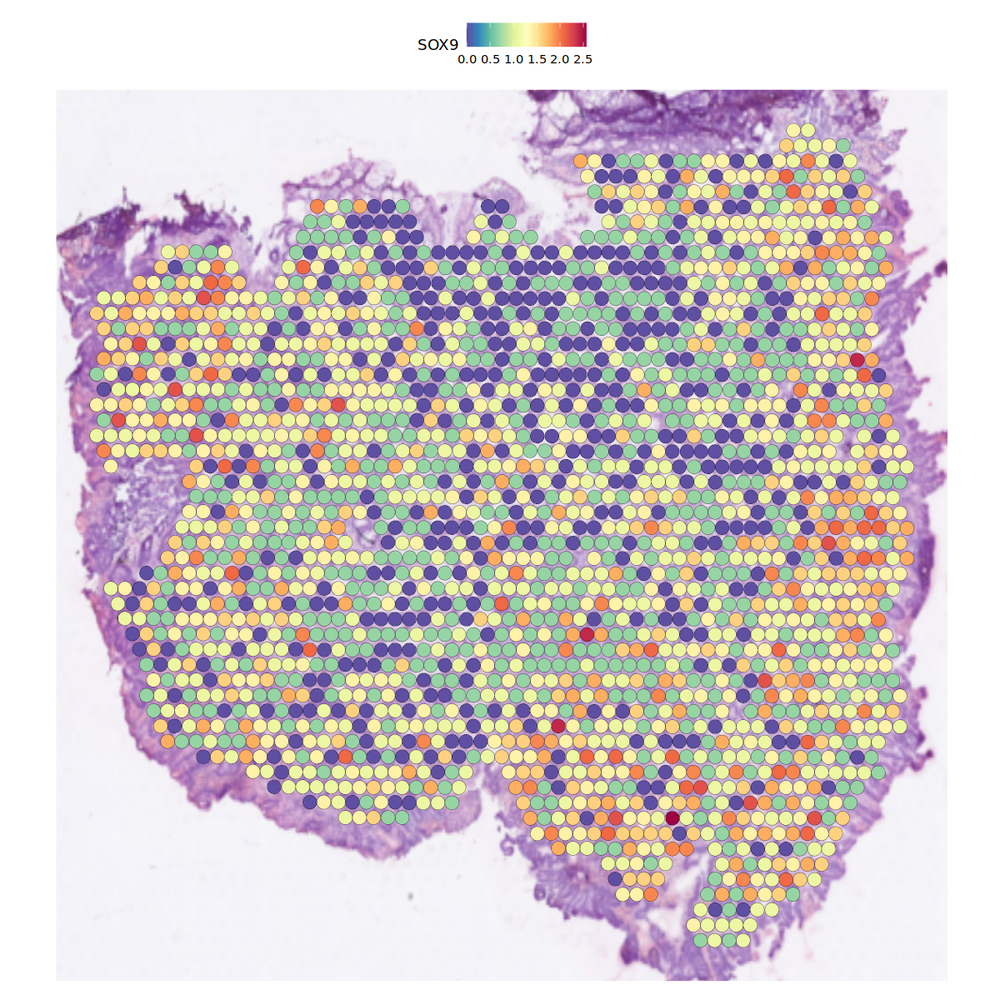

In [61]:
# rege
options(repr.plot.width=10, repr.plot.height=10)
SpatialFeaturePlot(s1r1, features = c("SOX9"))

In [55]:
table(s1r1$Pathologist_Annotations)


         epithelium&lamina propria                            exclude 
                               692                                151 
       IC aggregate_lamina propria                     lamina propria 
                                32                                188 
                non neo epithelium stroma_fibroblastic_IC med to high 
                               293                                249 
                             tumor        tumor&stroma_IC med to high 
                               337                                258 

In [57]:
s1r1.2 <- subset(s1r1, Pathologist_Annotations %in% c("non neo epithelium", "tumor"))

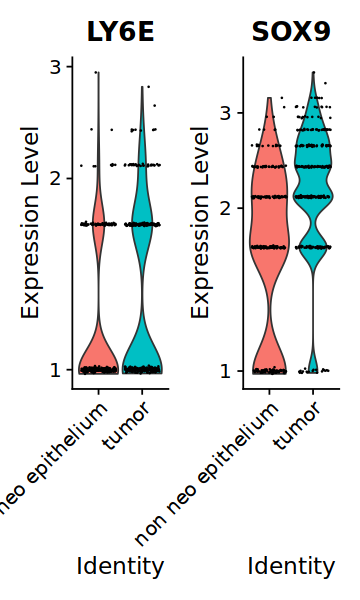

In [62]:
options(repr.plot.width=3, repr.plot.height=5)
VlnPlot(s1r1.2, features = c("LY6E","SOX9"), pt.size = 0.1, log = T, group.by = "Pathologist_Annotations") + NoLegend()

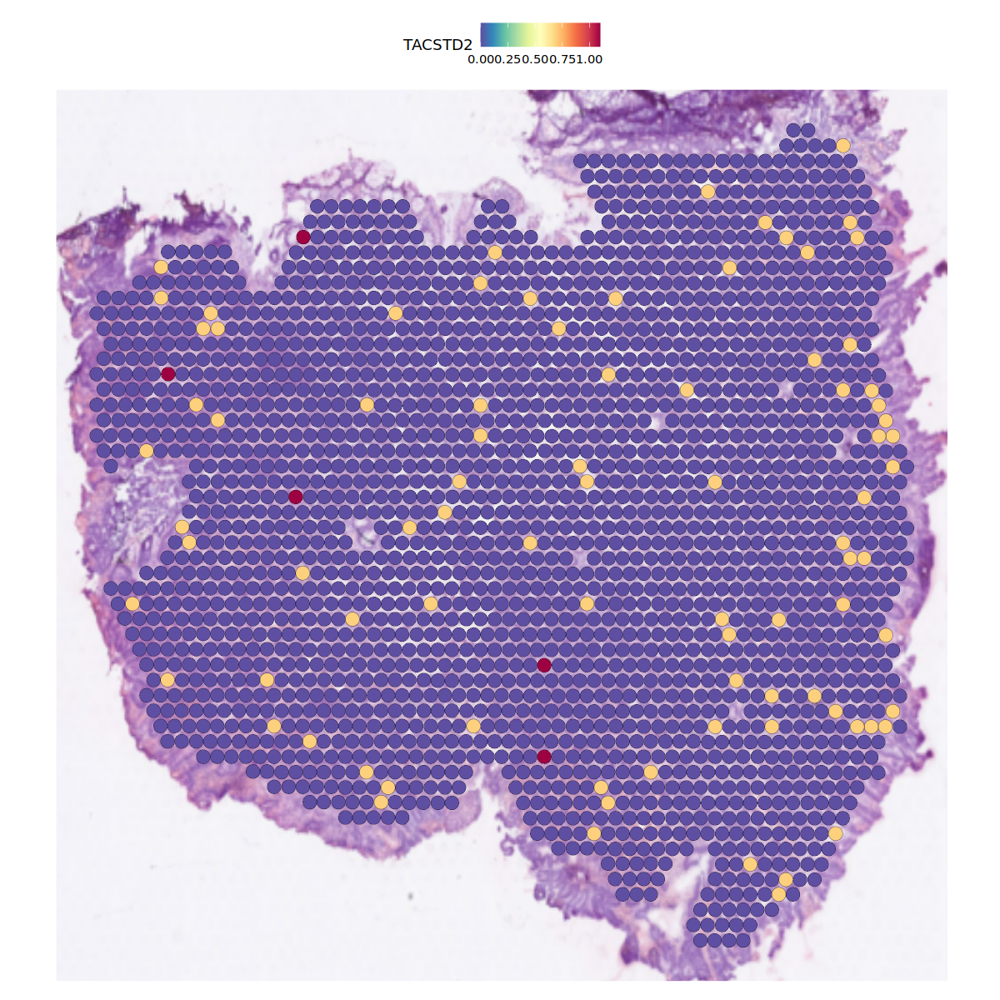

In [50]:
# fetal
options(repr.plot.width=10, repr.plot.height=10)
SpatialFeaturePlot(s1r1, features = c("TACSTD2"))